In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq
import anndata as ad

import seaborn as sns
import pickle
import warnings
warnings.filterwarnings("ignore")

In [10]:
FILE_NAME = "adata_combined_new.h5ad.final.filtered"
PATH2=f'/nfs/team298/ls34/adult_skin/final_adatas/{FILE_NAME}'
adata_5k=sc.read_h5ad(PATH2)
adata_5k=adata_5k[adata_5k.obs["tech"]=="xenium"]


def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata_5k.var_names]
    return LIST

CATEGORY="lvl5_annotation"
NICHE_COLUMN   = "niche19"
NICHE_COL=NICHE_COLUMN
 

# AD

In [11]:
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))


adata_5k_i= adata_5k[adata_5k.obs["disease_overall"] == "AD"]

adata_5k_i= adata_5k_i[adata_5k_i.obs["Site_status"] == "Lesional"]
sample_counts = adata_5k_i.obs["info_id6"].value_counts()
samples_to_keep = sample_counts[sample_counts > 1000].index


1 / 12
2 / 12
3 / 12
4 / 12
5 / 12
6 / 12
7 / 12
8 / 12
9 / 12
10 / 12
11 / 12
###error -  11
12 / 12
Error in callback <function _draw_all_if_interactive at 0x14c8f4518040> (for post_execute), with arguments args (),kwargs {}:


TypeError: '<' not supported between instances of 'float' and 'NoneType'

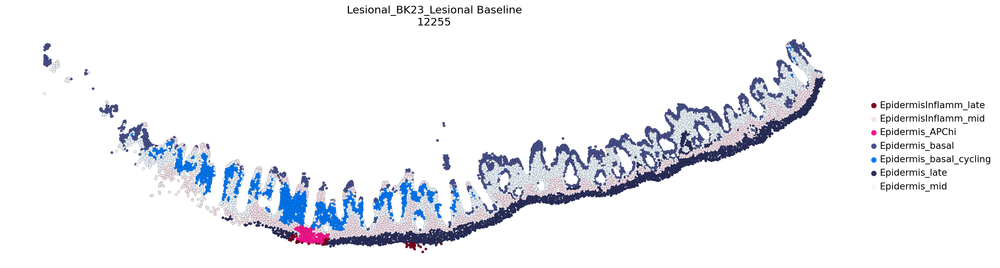

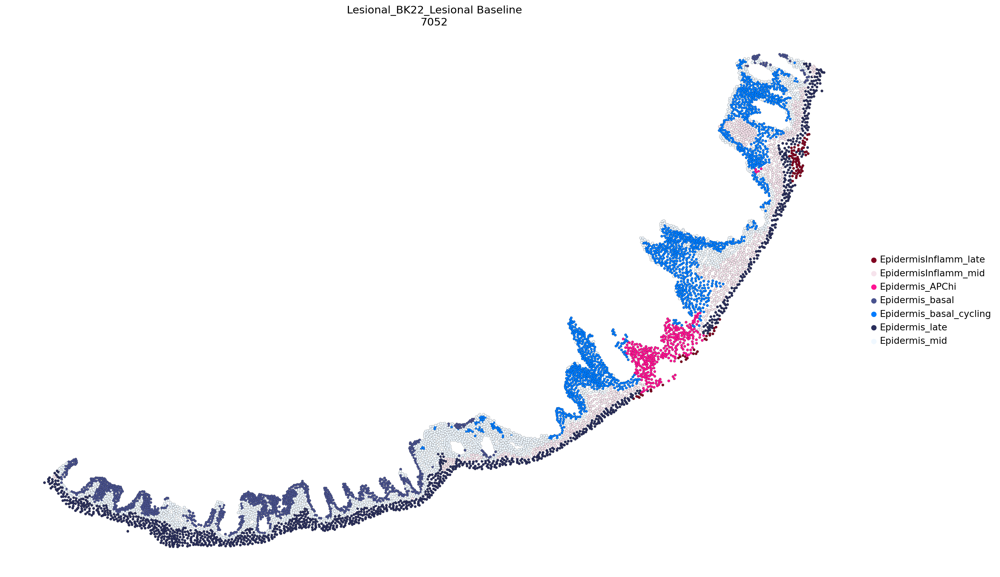

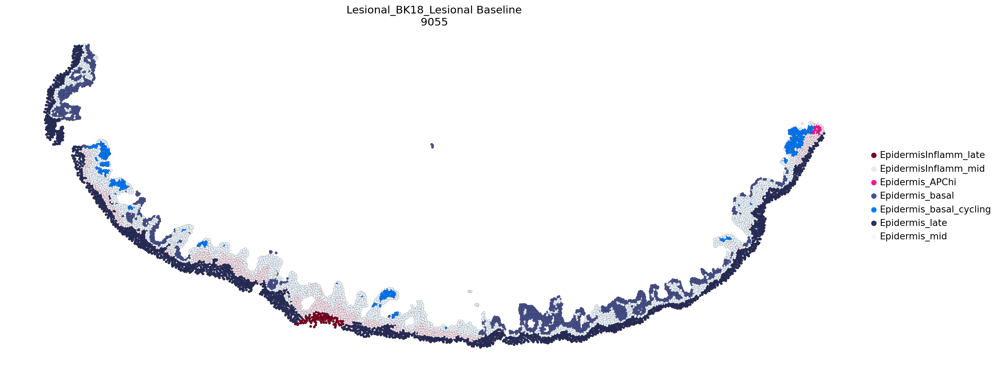

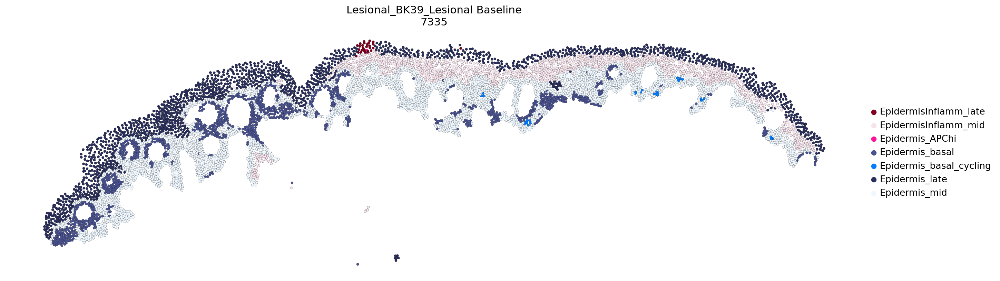

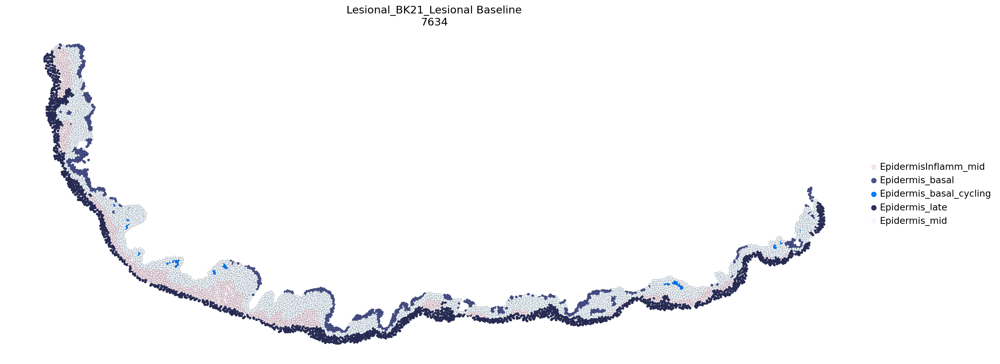

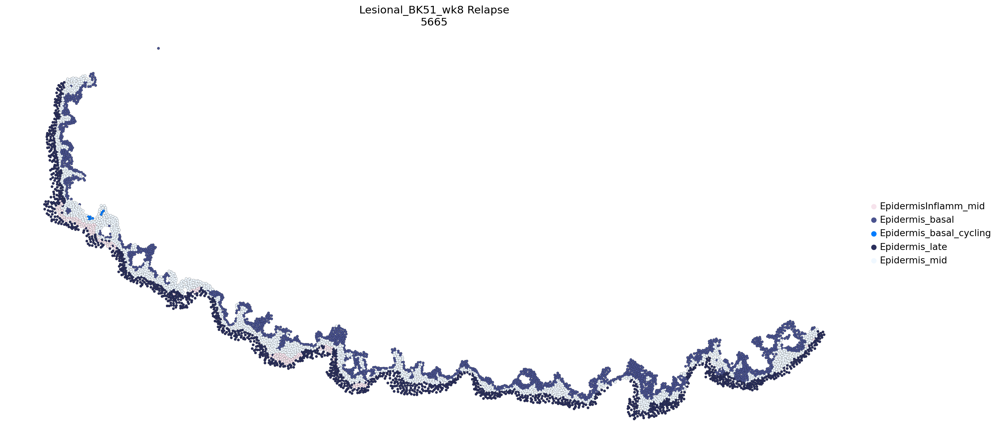

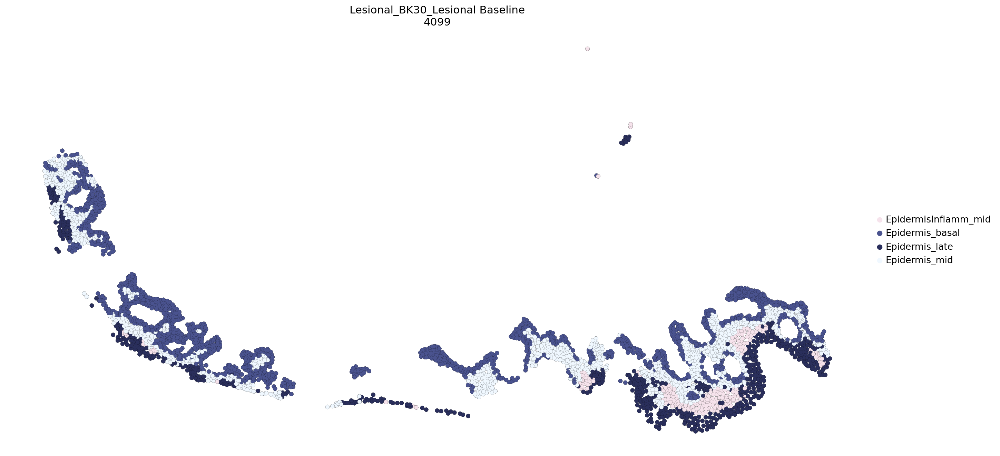

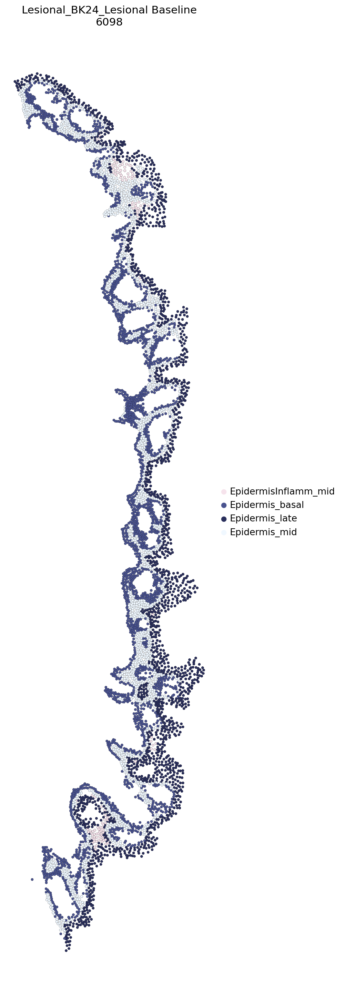

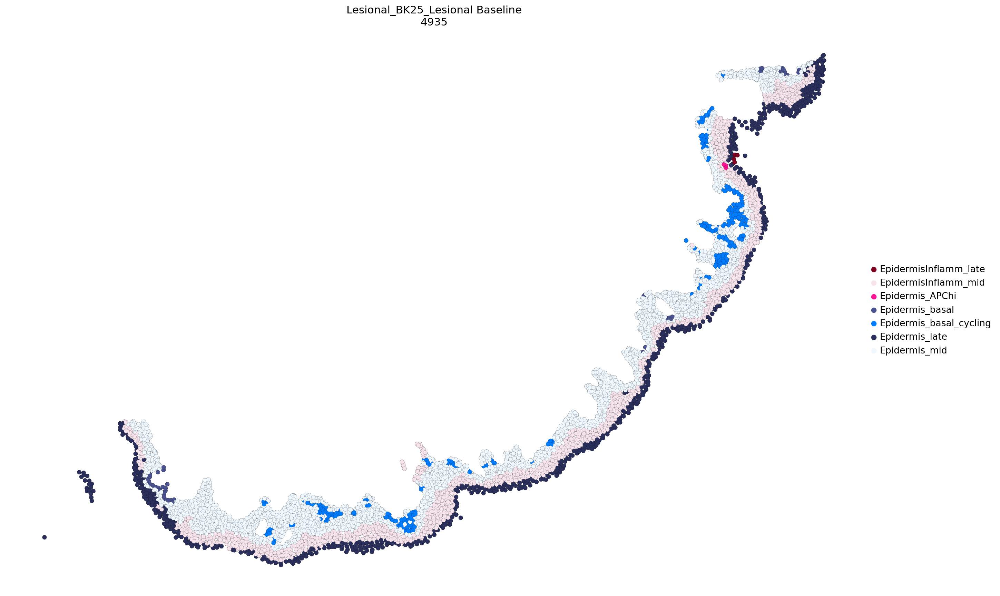

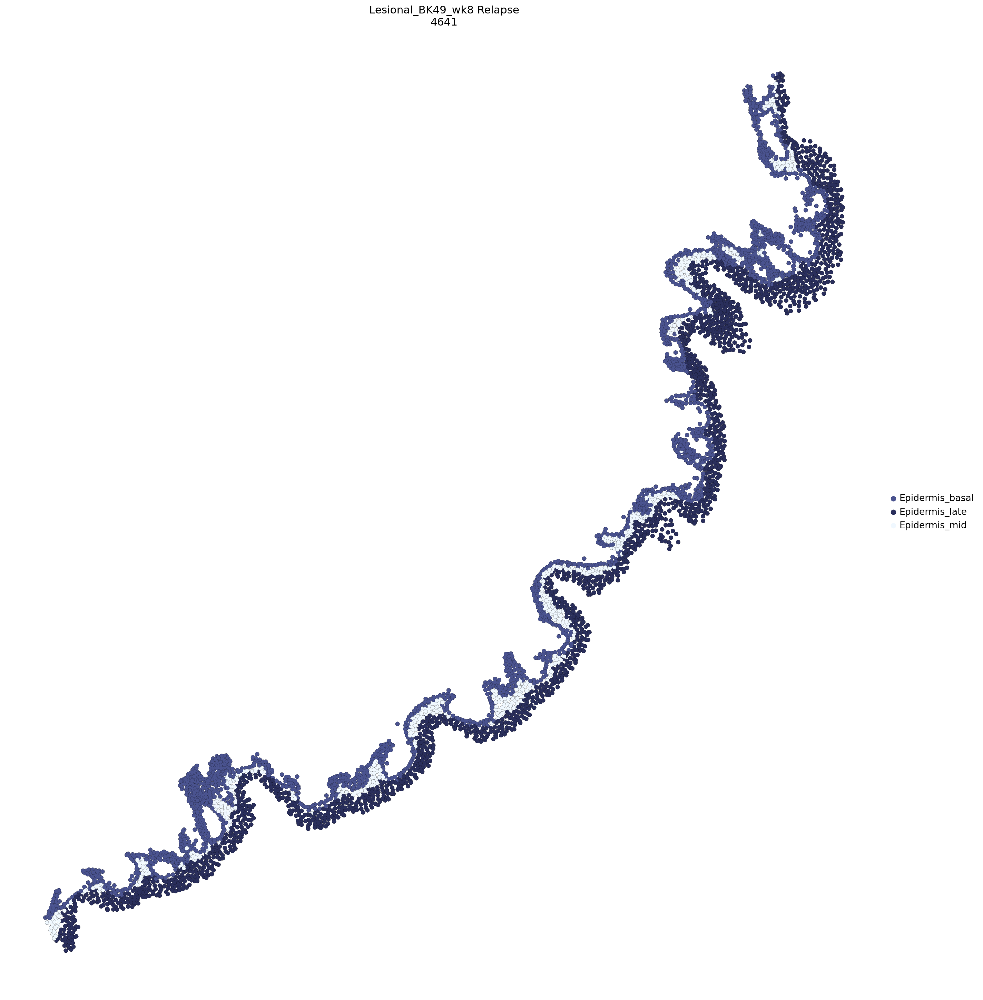

TypeError: '<' not supported between instances of 'float' and 'NoneType'

<Figure size 1440x1440 with 1 Axes>

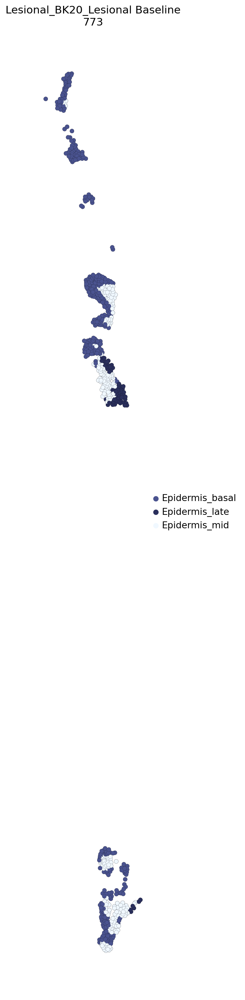

In [12]:

#adata_5k_i=adata
ORDER = []
for i,DONOR_ID in enumerate(samples_to_keep):
    try:
        print(i+1, "/", len(samples_to_keep))
        adata_i =  adata_5k_i[adata_5k_i.obs["info_id6"]==DONOR_ID]
        STATUS =  adata_i.obs["Site_status"].unique()[0]

        INFO_ID = list(adata_i.obs.info_id.unique())[0]
        adata_i=adata_i[adata_i.obs["niche19"].str.startswith("Epi")]
        if adata_i.shape[0] > 5000:
            SPOTSIZE=40
        else:
             SPOTSIZE=120
        sq.pl.spatial_scatter(
            adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
            library_id="spatial",
            shape=None,
            color="niche19",
            size=SPOTSIZE,
            vmax=1,
            title=str(STATUS) + "_" + DONOR_ID + "\n" + str(adata_i.shape[0]),
            #title=INFO_ID, #+ "_nonlesional",
            # legend_loc=None,
            # legend_loc="on data",
                    edgecolor="black",
            linewidth=0.1,
                    legend_fontsize=12,
            save = f"EpidermisONLY_{DONOR_ID}.pdf"

          
        )
    except:
        print("###error - ",i+1 )


# Psoriasis

1 / 4
2 / 4
3 / 4
4 / 4


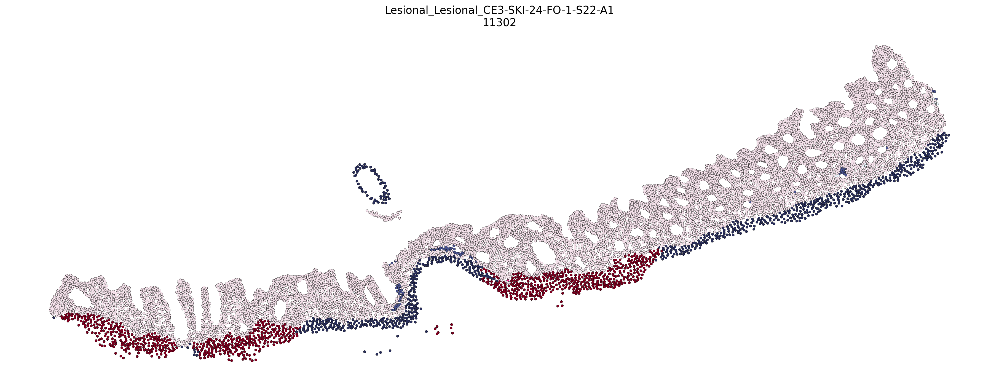

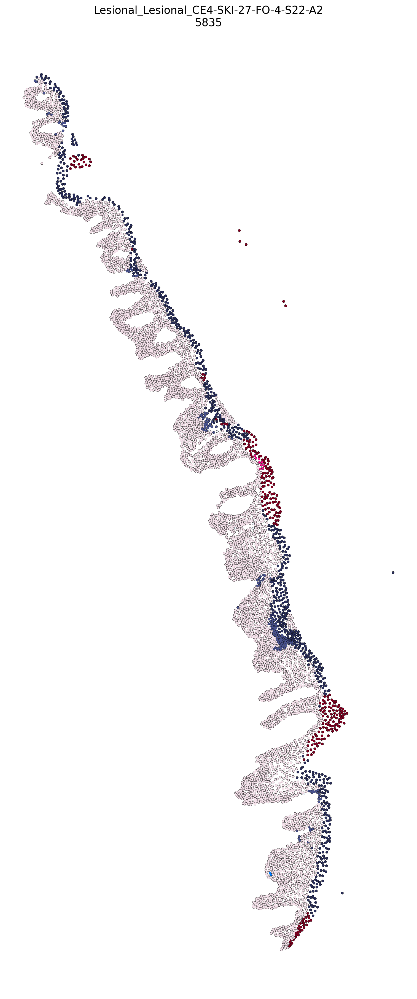

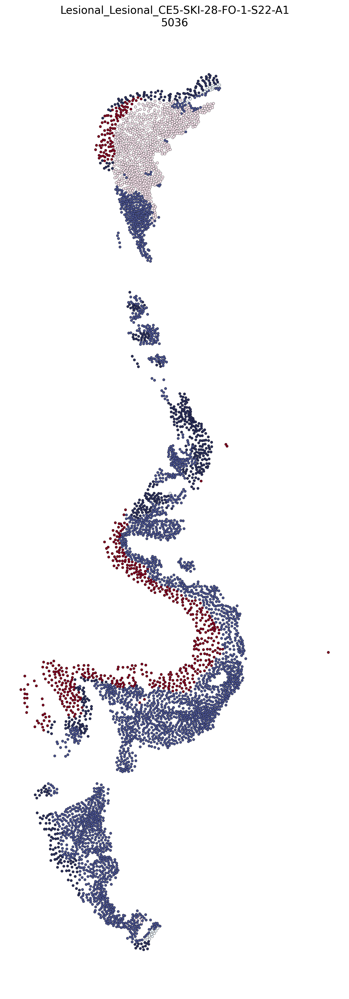

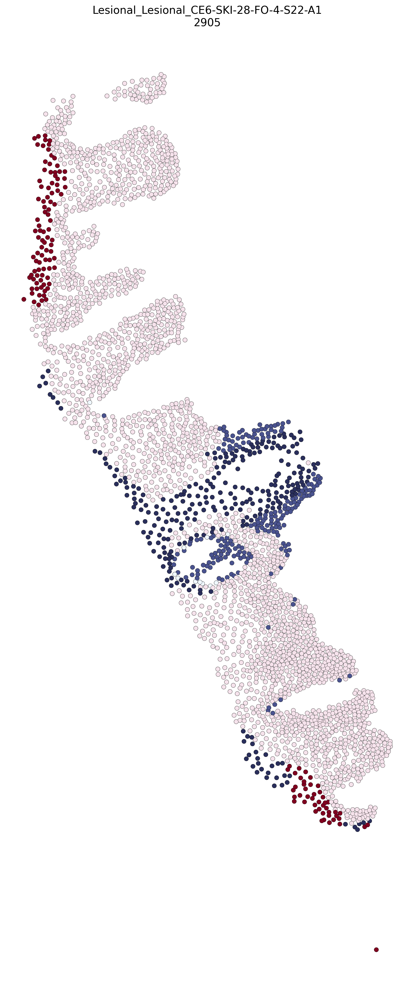

In [13]:
import warnings
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

# Suppress implicit modification warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
#adata_5k_i=adata_5k[adata_5k.obs["RUN_ID"] != "original"]

#adata_5k_i=adata_5k_i[adata_5k_i.obs["Sanger patient ID"].str.startswith("BK")]

#NICHE ='Plasma+pDC'
i=0
# try:
#     adata_5k.uns.pop('niche_name_colors')
# except:
#     1
sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
adata_5k_i= adata_5k[adata_5k.obs["disease_overall"] == "Psoriasis"]

adata_5k_i= adata_5k_i[adata_5k_i.obs["Site_status"] == "Lesional"]
sample_counts = adata_5k_i.obs["sample_id"].value_counts()
samples_to_keep = sample_counts[sample_counts > 1000].index
#filtered_adata = psoriasis_data[psoriasis_data.obs["sample_id"].isin(samples_to_keep)]
#adata_5k_i=adata
ORDER = []
for i,DONOR_ID in enumerate(samples_to_keep):
    print(i+1, "/", len(samples_to_keep))
    adata_i =  adata_5k_i[adata_5k_i.obs["sample_id"]==DONOR_ID]
    STATUS =  adata_i.obs["Site_status"].unique()[0]

    #RUN_ID = list(adata_i.obs.RUN_ID.unique())[0]
    INFO_ID = list(adata_i.obs.info_id.unique())[0]
    #del(adata_i.uns["combined_annotation2_colors"])
    #ORDER.append(tissue_section_id)
#     niche_names_found = adata_i.obs["niche_name"].unique()
   
#     if NICHE in niche_names_found:
#         adata_ii =  adata_i[adata_i.obs["niche_name"]==NICHE]
#         if adata_ii.shape[0] > 10:
#     #         if i ==0:

#     #             sq.pl.spatial_scatter(
#     #                 adata_i,
#     #                 library_id="spatial",
#     #                 shape=None,
#     #                 color="niche_name",
#     #                 size=1,
#     #                 vmax=1,
#     #                 title=tissue_section_id,
#     #                 #ax=ax,
#     #                 #legend_loc="on data"  # Disable the legend for each subplot
#     #             )       
#             i=i+1

#             print(tissue_section_id)
    adata_i=adata_i[adata_i.obs["niche19"].str.startswith("Epi")]
    if adata_i.shape[0] > 5000:
        SPOTSIZE=40
    else:
        SPOTSIZE=130

    sq.pl.spatial_scatter(
        adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
        library_id="spatial",
        shape=None,
        color="niche19",
        size=SPOTSIZE,
        vmax=1,
        title=str(STATUS) + "_" + DONOR_ID + "\n" + str(adata_i.shape[0]),
        #title=INFO_ID, #+ "_nonlesional",
        legend_loc=None,
        # legend_loc="on data",
                edgecolor="black",
        linewidth=0.2,
                legend_fontsize=12,

        
        save = f"EpidermisONLY_{DONOR_ID}.pdf"

        #ax=ax,
        #legend_loc="on data"  # Disable the legend for each subplot
    )
#     sq.pl.spatial_scatter(
#         adata_i,#[adata_i.obs["Timepoint"].str.startswith("Les")],
#         library_id="spatial",
#         shape=None,
#         color="MKI67",
#         size=SPOTSIZE,
#         vmax=1,
#         title=str(STATUS) + "_" + DONOR_ID + "\n" + str(adata_i.shape[0]),
#         #title=INFO_ID, #+ "_nonlesional",
#         # legend_loc=None,
#         # legend_loc="on data",
#                 edgecolor="black",
#         linewidth=0.1,
#                 legend_fontsize=12,

#         #ax=ax,
#         #legend_loc="on data"  # Disable the legend for each subplot
#     )
 

# barplots

In [14]:
import pickle

with open('/nfs/team298/ls34/niche_colors.pkl', 'rb') as f:
    colors_new2 = pickle.load(f)



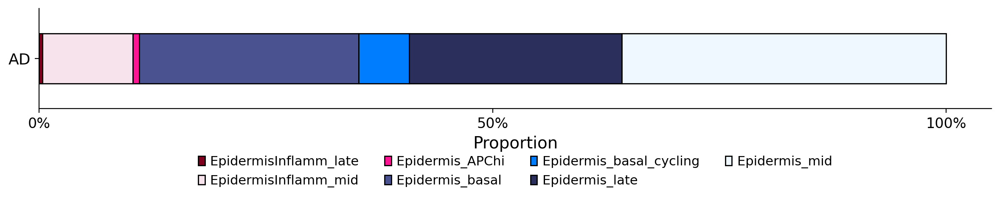

In [15]:
# Constant
NICHE11 = "Epider"

# Filter the data
adata_filtered = adata_5k[
    adata_5k.obs["niche19"].str.startswith(NICHE11)
]
adata_filtered=adata_filtered[adata_filtered.obs["disease_overall"]=="AD"]
sample_counts = adata_filtered.obs["sample_id"].value_counts()
valid_samples = sample_counts[sample_counts > 10].index
KEEP = ["Lesional", "Lesional Baseline"]
adata_filtered = adata_filtered[adata_filtered.obs["Timepoint"].isin(KEEP)]
adata_filtered = adata_filtered[adata_filtered.obs["sample_id"].isin(valid_samples)]

# Drop irrelevant cell types
adata_filtered = adata_filtered[~adata_filtered.obs["lvl5_annotation"].str.startswith("KC_S")]
adata_filtered = adata_filtered[~adata_filtered.obs["lvl5_annotation"].str.startswith("Sweat")]
adata_filtered = adata_filtered[~adata_filtered.obs["lvl5_annotation"].str.startswith("Nonsp")]

# Extract relevant columns
df = adata_filtered.obs[["niche19", "disease_overall"]].copy()

# Count niche11 cell types per disease group
grouped = df.groupby(["disease_overall", "niche19"]).size().reset_index(name="count")

# Pivot to matrix
pivot = grouped.pivot(index="disease_overall", columns="niche19", values="count").fillna(0)

# Normalize to get proportions
proportions = pivot.div(pivot.sum(axis=1), axis=0) * 100

# Load colors
# with open(COLOR_PICKLE_PATH, 'rb') as f:
#     colors = pickle.load(f)

# Map colors to niche11 groups
plot_colors = [colors_new2.get(niche, "grey") for niche in proportions.columns]

# Plot
fig, ax = plt.subplots(figsize=(12, 3))
proportions.plot(
    kind="barh",
    stacked=True,
    color=plot_colors,
    edgecolor="black",
    ax=ax
)

# Labels and title
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("Proportion", fontsize=14)
ax.set_title(f"", fontsize=1)
ax.set_xticks([0, 50, 100])
ax.set_xticklabels(["0%", "50%", "100%"], fontsize=12)
ax.set_yticks(range(len(proportions)))
ax.set_yticklabels(proportions.index, fontsize=13)

# Legend below
ax.legend(
    title="",
    labels=proportions.columns,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.35),
    ncol=4,
    fontsize=11,
    title_fontsize=10,
    frameon=False
)

# Clean up
ax.grid(False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
fig.savefig(
    "supp_ADEpidermi_composition.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.show()



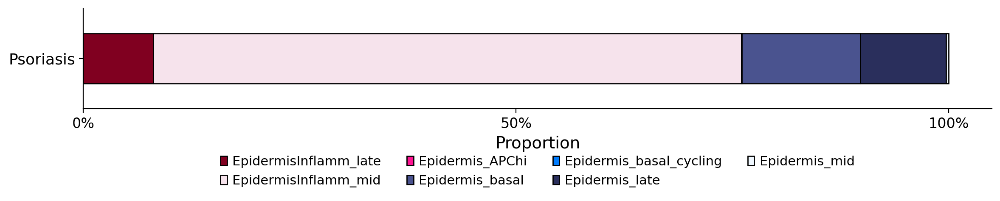

In [16]:
# Constant
NICHE11 = "Epider"

# Filter the data
adata_filtered = adata_5k[
    adata_5k.obs["niche19"].str.startswith(NICHE11)
]
adata_filtered=adata_filtered[adata_filtered.obs["disease_overall"]=="Psoriasis"]
sample_counts = adata_filtered.obs["sample_id"].value_counts()
valid_samples = sample_counts[sample_counts > 10].index
KEEP = ["Lesional", "Lesional Baseline"]
adata_filtered = adata_filtered[adata_filtered.obs["Timepoint"].isin(KEEP)]
adata_filtered = adata_filtered[adata_filtered.obs["sample_id"].isin(valid_samples)]

# Drop irrelevant cell types
adata_filtered = adata_filtered[~adata_filtered.obs["lvl5_annotation"].str.startswith("KC_S")]
adata_filtered = adata_filtered[~adata_filtered.obs["lvl5_annotation"].str.startswith("Sweat")]
adata_filtered = adata_filtered[~adata_filtered.obs["lvl5_annotation"].str.startswith("Nonsp")]

# Extract relevant columns
df = adata_filtered.obs[["niche19", "disease_overall"]].copy()

# Count niche11 cell types per disease group
grouped = df.groupby(["disease_overall", "niche19"]).size().reset_index(name="count")

# Pivot to matrix
pivot = grouped.pivot(index="disease_overall", columns="niche19", values="count").fillna(0)

# Normalize to get proportions
proportions = pivot.div(pivot.sum(axis=1), axis=0) * 100

# Load colors
# with open(COLOR_PICKLE_PATH, 'rb') as f:
#     colors = pickle.load(f)

# Map colors to niche11 groups
plot_colors = [colors_new2.get(niche, "grey") for niche in proportions.columns]

# Plot
fig, ax = plt.subplots(figsize=(12, 3))
proportions.plot(
    kind="barh",
    stacked=True,
    color=plot_colors,
    edgecolor="black",
    ax=ax
)

# Labels and title
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("Proportion", fontsize=14)
ax.set_title(f"", fontsize=1)
ax.set_xticks([0, 50, 100])
ax.set_xticklabels(["0%", "50%", "100%"], fontsize=12)
ax.set_yticks(range(len(proportions)))
ax.set_yticklabels(proportions.index, fontsize=13)

# Legend below
ax.legend(
    title="",
    labels=proportions.columns,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.35),
    ncol=4,
    fontsize=11,
    title_fontsize=10,
    frameon=False
)

# Clean up
ax.grid(False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
fig.savefig(
    "supp_PsoEpidermi_composition.pdf",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

